In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

from config import Config
import utils
import model_101_crop as modellib
import visualize
from model import log
from dsb2018 import Dsb2018Dataset
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')


%matplotlib inline

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Root directory of the project
ROOT_DIR = os.getcwd()

/home/keven/.virtualenvs/tensorflow/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
import csv
import math
import random
import numpy as np
import cv2

from config import Config
import utils
import json
import os

from cv2 import imread

class Dsb2018DatasetMulticlass(utils.Dataset):
    """Generates the shapes synthetic dataset. The dataset consists of simple
    shapes (triangles, squares, circles) placed randomly on a blank surface.
    The images are generated on the fly. No file access required.
    """
    class_map = dict()

    def load_dsb2018(self, pathname, class_pathname, is_trainset = True):
        """Generate the requested number of synthetic images.
        count: number of images to generate.
        height, width: the size of the generated images.
        """

        def get_file_data(json_pathname, images_pathname, masks_pathname=None):
            if os.path.exists(json_pathname):
                with open(json_pathname) as data:
                    dictionaries = json.load(data)
            else:
                dictionaries = []

            for dictionary in dictionaries:
                dictionary["image"]["pathname"] = os.path.join(images_pathname, dictionary["image"]["pathname"])
                dictionary["image"]["id"] = dictionary["image"]["pathname"][:-4]


                if masks_pathname:
                    for index, instance in enumerate(dictionary["objects"]):
                        dictionary["objects"][index]["mask"]["pathname"] = os.path.join(masks_pathname, dictionary["objects"][index]["mask"]["pathname"])

            return dictionaries

        def load_image_class(class_pathname):
            if os.path.exists(class_pathname):
                with open(class_pathname, ) as csvfile:
                    reader = csv.DictReader(csvfile)
                    for row in reader:
                        if row['foreground'] == 'white':
                            self.class_map[row['filename'][:-4]] = 'white'
                        elif row['foreground'] == 'purple':
                            self.class_map[row['filename'][:-4]] = 'purple'
                        elif row['foreground'] == 'black':
                            self.class_map[row['filename'][:-4]] = 'black'
                        else:
                            assert(True == False)


        # Add classes
        self.add_class("dsb2018", 1, "white")
        self.add_class("dsb2018", 2, "purple")
        self.add_class("dsb2018", 3, "black")

        images_pathname = os.path.join(pathname, "images")
        masks_pathname = os.path.join(pathname, "masks")


        training_pathname = os.path.join(pathname, "training.json")
        training = get_file_data(training_pathname, images_pathname, masks_pathname)
        load_image_class(class_pathname)
        i=0
        for image in training:
            if i%10==3:
                if is_trainset == False:
                    self.add_image(source='dsb2018',
                                   image_id=image['image']['id'],
                                   path=image['image']['pathname'],
                                   shape=image['image']['shape'], objects = image['objects'])

            else:
                if is_trainset:
                    self.add_image(source='dsb2018',
                                   image_id=image['image']['id'],
                                   path=image['image']['pathname'],
                                   shape=image['image']['shape'], objects = image['objects'])
            i+=1



    def image_reference(self, image_id):
        """Return the shapes data of the image."""
        super(self.__class__).image_reference(self, image_id)

    def load_mask(self, image_id):
        """Generate instance masks for shapes of the given image ID.
        """
        info = self.image_info[image_id]
        id = info['id'].split('/')[-1]
        
        objects = info['objects']
        instance_masks = []
        class_ids = []
        class_name = self.class_map[id]
        class_id = self.class_names.index(class_name)
        
        for obj in objects:
            mask = cv2.imread(obj['mask']['pathname'], 0)
            instance_masks.append(mask)
            class_name = self.class_map[id]
            class_ids.append(class_id)

        mask = np.stack(instance_masks, axis=2)
        class_ids = np.array(class_ids, dtype=np.int32)
        return mask, class_ids

In [3]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "dsb2018_logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Size of train data:602
Size of val data:67
class id: 1


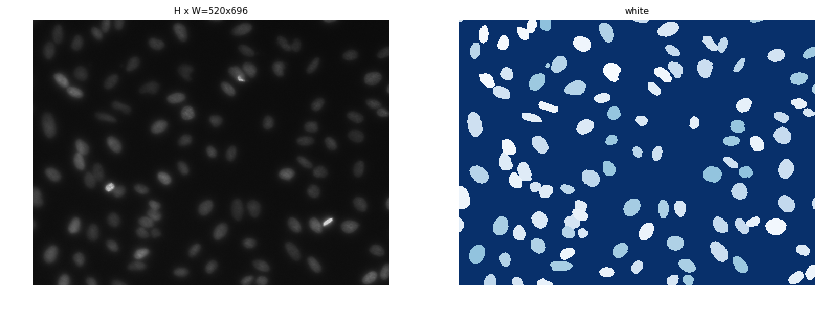

class id: 1


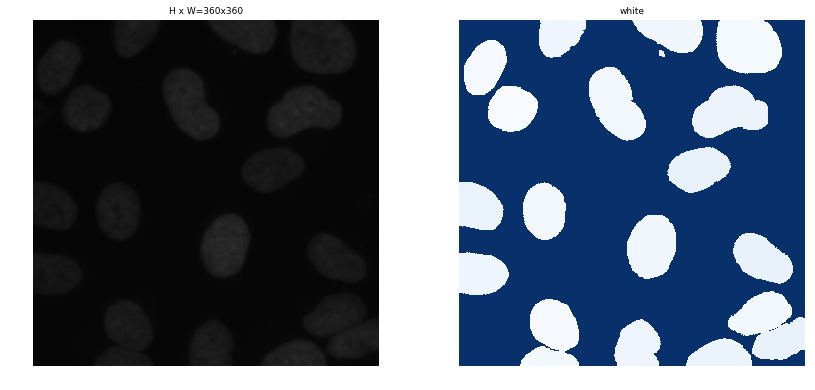

class id: 1


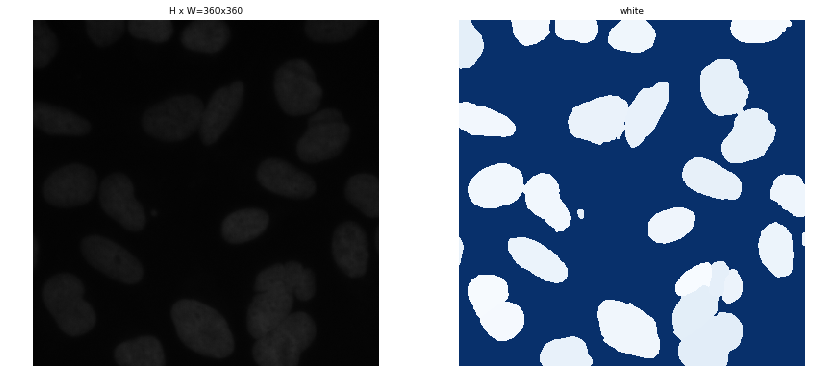

class id: 1


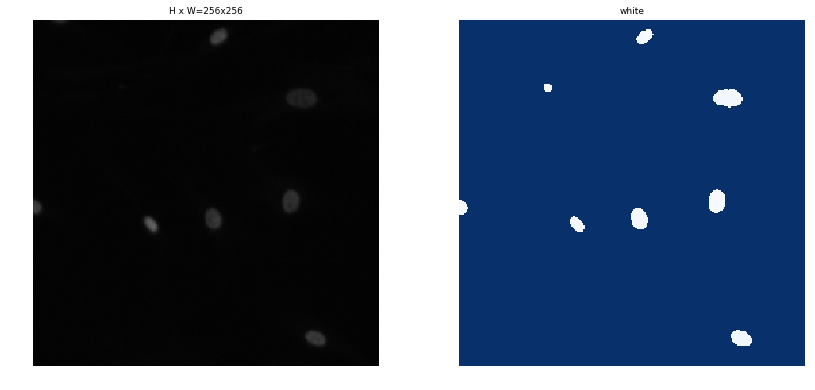

class id: 1


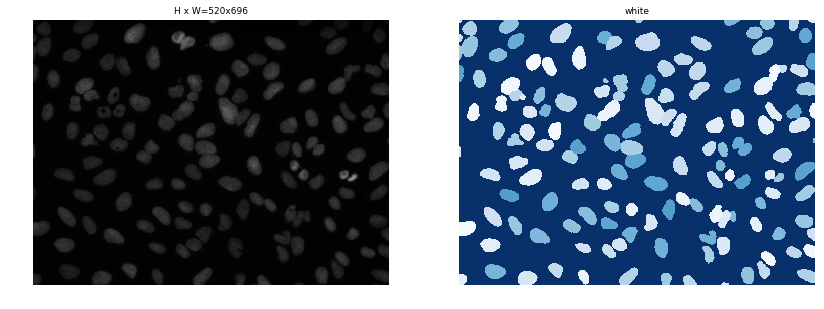

class id: 1


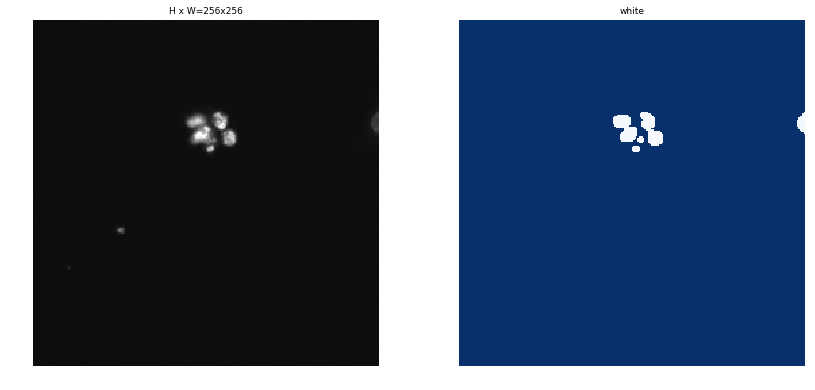

class id: 1


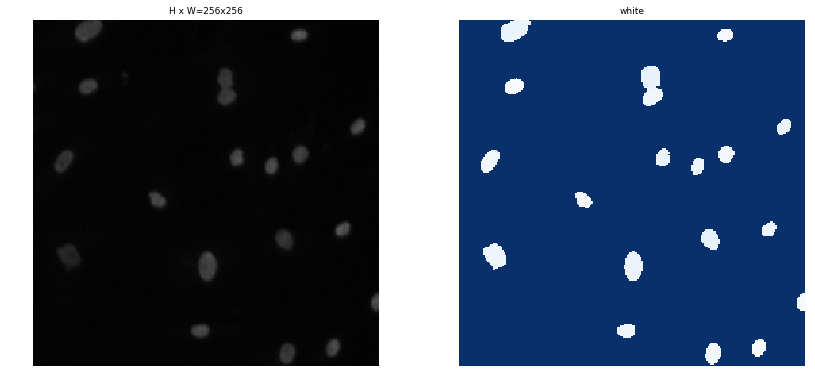

class id: 1


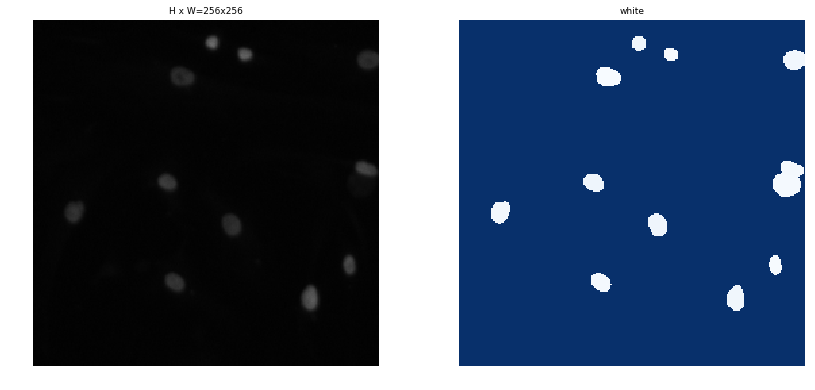

In [4]:
# Training dataset
train_data = Dsb2018DatasetMulticlass()
train_data.load_dsb2018('../DSB2018', '../classes.csv')
train_data.prepare()

val_data = Dsb2018DatasetMulticlass()
val_data.load_dsb2018('../DSB2018', '../classes.csv',is_trainset=False)
val_data.prepare()
print("Size of train data:{}".format(len(train_data.image_ids)))
print("Size of val data:{}".format(len(val_data.image_ids)))


#Load and display random samples
image_ids = np.random.choice(train_data.image_ids, 4)
for image_id in image_ids:
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    print("class id: {}".format(class_ids[0]))
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    
    
#Load and display random samples
image_ids = np.random.choice(val_data.image_ids, 4)
for image_id in image_ids:
    image = val_data.load_image(image_id)
    mask, class_ids = val_data.load_mask(image_id)
    print("class id: {}".format(class_ids[0]))
    visualize.display_top_masks(image, mask, class_ids, val_data.class_names, limit=1)


In [5]:
# check number of images for different class

train_num_white = 0
train_num_purple = 0
train_num_black = 0


val_num_white = 0
val_num_purple = 0
val_num_black = 0

    
#Load and display random samples
for i, image_id in tqdm(enumerate(train_data.image_ids), total = len(train_data.image_ids)):
    _, class_ids = train_data.load_mask(image_id)
    if class_ids[0] == 1:
        train_num_white +=1
    elif class_ids[0] == 2:
        train_num_purple +=1
    elif class_ids[0] == 3:
        train_num_black +=1
    else:
        assert(True == False)
print("train data: white:{}, purple:{}, black:{}".format(train_num_white, 
                                                             train_num_purple,
                                                             train_num_black))

#Load and display random samples
for i, image_id in tqdm(enumerate(val_data.image_ids), total = len(val_data.image_ids)):
    _, class_ids = val_data.load_mask(image_id)
    if class_ids[0] == 1:
        val_num_white +=1
    elif class_ids[0] == 2:
        val_num_purple +=1
    elif class_ids[0] == 3:
        val_num_black +=1
    else:
        assert(True == False)
print("val data: white:{}, purple:{}, black:{}".format(val_num_white, 
                                                             val_num_purple,
                                                             val_num_black))

 21%|██        | 14/67 [00:00<00:00, 136.55it/s]

train data: white:490, purple:98, black:14


100%|██████████| 67/67 [00:02<00:00, 24.46it/s] 

val data: white:55, purple:10, black:2


In [10]:
class Dsb2018Config(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "crop_hflip_rotate_highQ_all_multiclass"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 3  # background + 3 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    
    USE_MINI_MASK = True
    
    #MINI_MASK_SHAPE = (112, 112)  # (height, width) of the mini-mask


    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    
    #TODO: in trainning time, set both of these two as 100 and change to 200 during predication time!
    TRAIN_ROIS_PER_IMAGE = 720
    
    RPN_TRAIN_ANCHORS_PER_IMAGE = 768

    #RPN_NMS_THRESHOLD = 0.7
    
    DETECTION_MAX_INSTANCES = 512
    
    MAX_GT_INSTANCES = 300
    
    RPN_ANCHOR_RATIOS = [0.5,1, 2]

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 602

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 67
    
    DETECTION_MIN_CONFIDENCE = 0.7



config = Dsb2018Config()

# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last()[1], by_name=True)

print("model ready!")

using architecture:resnet101
model ready!


In [11]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

val data:
17


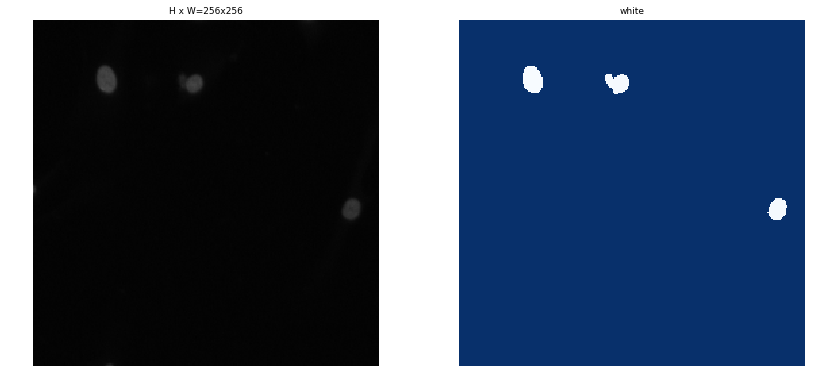

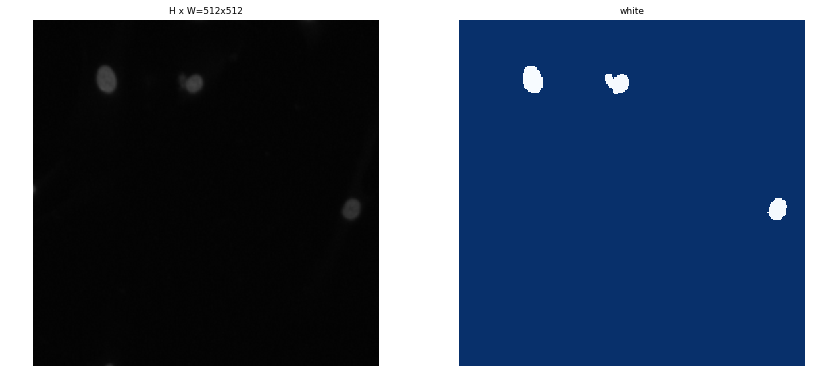

19


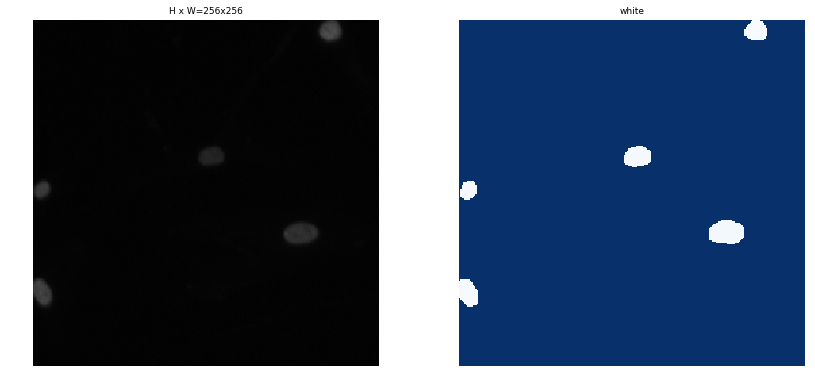

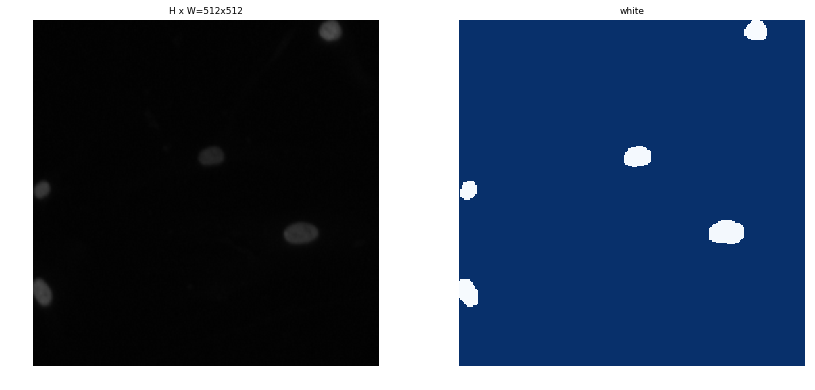

40


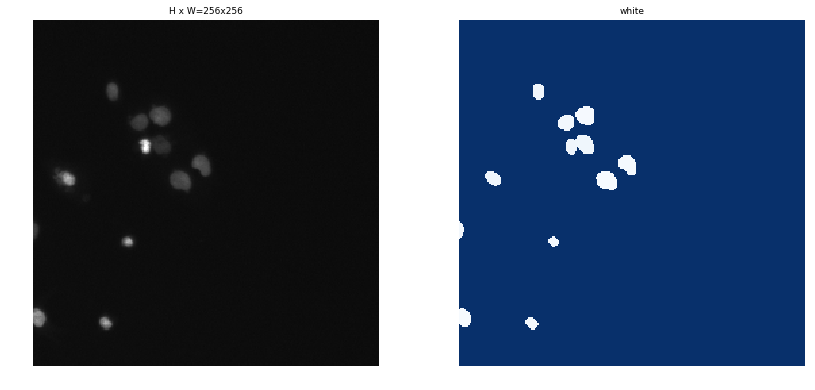

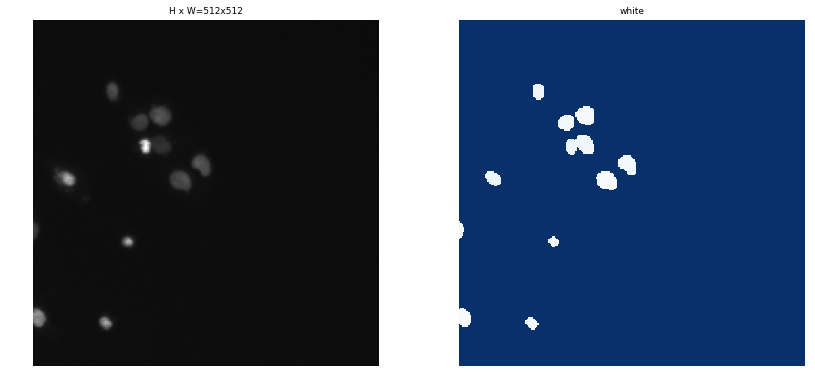

In [12]:
from skimage.io import imread, imshow, imread_collection, concatenate_images

# print("train data:")

# image_ids = np.random.choice(train_data.image_ids, 1)
# for image_id in image_ids:
#     image = train_data.load_image(image_id)
#     mask, class_ids = train_data.load_mask(image_id)
#     visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
#     output_image, _, class_ids, _, output_masks = modellib.load_image_gt(train_data, config, image_id, augment=True, use_mini_mask = False)
#     visualize.display_top_masks(output_image, output_masks, class_ids, train_data.class_names, limit=1)
  

print("val data:")
image_ids = np.random.choice(val_data.image_ids, 3)
for image_id in image_ids:
# for image_id in val_data.image_ids:
# for image_id in [37, 44, 48]:
    print(image_id)
    image = val_data.load_image(image_id)
#     print(val_data.image_info[image_id]['shape'])
    mask, class_ids = val_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, val_data.class_names, limit=1)
    output_image, _, class_ids, _, output_masks = modellib.load_image_gt(val_data, config, image_id, augment=False, use_mini_mask = False)
    visualize.display_top_masks(output_image, output_masks, class_ids, val_data.class_names, limit=1)



In [8]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [ ]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.

LEARNING_RATE=1e-5

# model.train(train_data, val_data,
#             learning_rate=config.LEARNING_RATE,
#             epochs=800,
#             layers='all')

model.train(train_data, val_data,
             learning_rate=config.LEARNING_RATE,
             epochs=200,
             layers='all')


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/crop_hflip_rotate_highq_all_multiclass20180319T2344/mask_rcnn_crop_hflip_rotate_highq_all_multiclass_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a

Epoch 1/200
 13/602 [..............................] - ETA: 4:50:24 - loss: 4.2053 - rpn_class_loss: 0.3556 - rpn_bbox_loss: 1.8876 - mrcnn_class_loss: 0.4094 - mrcnn_bbox_loss: 1.0344 - mrcnn_mask_loss: 0.5183

In [17]:
import scipy.misc
        
import json
from skimage.io import imread, imshow, imread_collection, concatenate_images
import matplotlib.pyplot as plt
from utils import resize_image, resize_mask

class InferenceConfig(Dsb2018Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.65

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
# model_path = model.find_last()[1]
model_path = '/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/crop_hflip_rotate_highq_all_multiclass20180319T1135/mask_rcnn_crop_hflip_rotate_highq_all_multiclass_0027.h5'
print(model_path)

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

def unpad(img, pad):
    y,x = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx]

def unpad3d(img, pad):
    y,x, _ = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx, :]


def revert_size(image, origin_size):
    result = scipy.misc.imresize(
            image,(origin_size[0],origin_size[1]))
    return result
    
def revert_size3d(image, origin_size):
    return scipy.misc.imresize(
            image, (origin_size[0], origin_size[1]))

def revert_resizing_3d(img, origin_size, padding):
    unpadding = unpad3d(img, padding)
    return revert_size3d(unpadding, origin_size)

def revert_resizing(img, origin_size, padding):
    unpadding = unpad(img, padding)
    try:
        return revert_size(unpadding, origin_size)
    except ValueError:
        print("error img, shape:{}, unpadding shape:{}, scale:{}, padding:{}"
              .format(img.shape, unpadding.shape, scale, padding))

def load_testset(pathname):
    dictionaries = []
    with open(pathname) as data:
        dictionaries = json.load(data)
    return dictionaries

base_dir = '../DSB2018'

test_set = load_testset(os.path.join(base_dir, 'test.json'))

using architecture:resnet101
/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/crop_hflip_rotate_highq_all_multiclass20180319T1135/mask_rcnn_crop_hflip_rotate_highq_all_multiclass_0027.h5
Loading weights from  /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/crop_hflip_rotate_highq_all_multiclass20180319T1135/mask_rcnn_crop_hflip_rotate_highq_all_multiclass_0027.h5


563
raw shape:(256, 256, 3)
original_image           shape: (512, 512, 3)         min:    1.00000  max:  107.00000
image_meta               shape: (12,)                 min:    0.00000  max:  563.00000
gt_class_id              shape: (44,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (44, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 44)        min:    0.00000  max:  255.00000


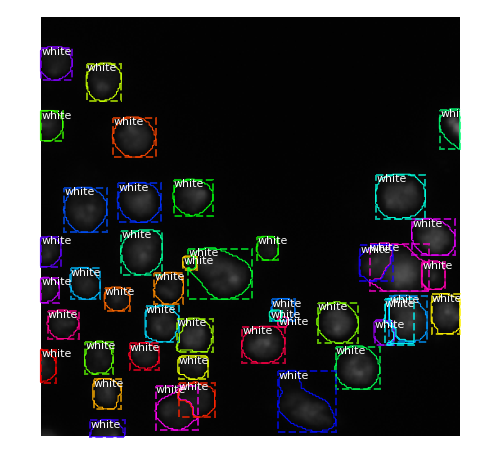

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  107.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:    3.10000
image_metas              shape: (1, 12)               min:    0.00000  max:  512.00000


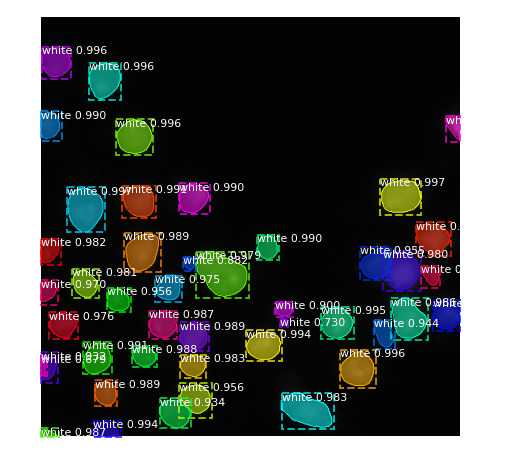

In [18]:
# Test on a random train image
# try 8
# image_id = random.choice(train_data.image_ids)
image_id=563
print(image_id)
image = train_data.load_image(image_id)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(train_data, inference_config, 
                           image_id, use_mini_mask=False)
print("raw shape:{}".format(image.shape))
log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_data.class_names, figsize=(8, 8))

# mask, class_ids = train_data.load_mask(image_id)
# visualize.display_top_masks(original_image, mask, class_ids, train_data.class_names, limit=1)

results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())

37
raw shape:(256, 256, 3)
original_image           shape: (512, 512, 3)         min:    1.00000  max:   87.00000
image_meta               shape: (12,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (11,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (11, 4)               min:   40.00000  max:  512.00000
gt_mask                  shape: (512, 512, 11)        min:    0.00000  max:  255.00000
img size:(512, 512, 3)
mask size:(512, 512, 11)


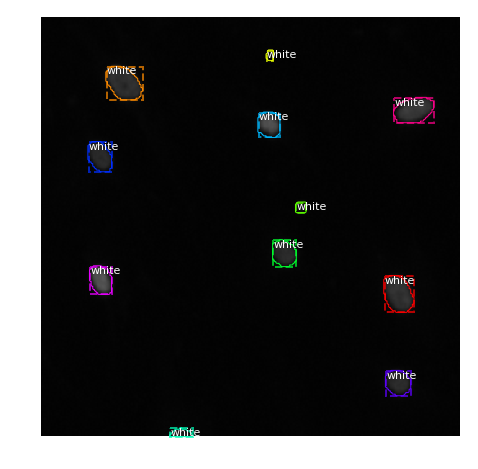

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:   87.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  -16.90000
image_metas              shape: (1, 12)               min:    0.00000  max:  512.00000


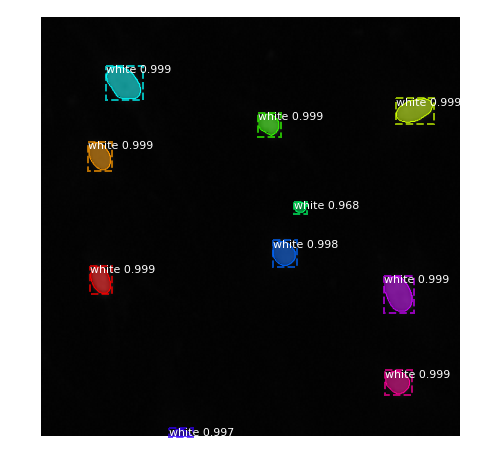

In [19]:
# Test on a random validation image
image_id = random.choice(val_data.image_ids)
# image_id=17, 29, 52
# image_id=18
print(image_id)
image = val_data.load_image(image_id)

original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_data, inference_config, 
                           image_id, use_mini_mask=False)

print("raw shape:{}".format(image.shape))
log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

print("img size:{}".format(original_image.shape))
print("mask size:{}".format(gt_mask.shape))

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            val_data.class_names, figsize=(8, 8))


results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            val_data.class_names, r['scores'], ax=get_ax())



25
{'objects': [], 'image': {'pathname': '505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81.png', 'shape': {'r': 512, 'channels': 3, 'c': 640}, 'checksum': '60e58d0b01c10ce966f805e8ef879c09'}}
original shape:(512, 640, 3)
resized shape:(512, 512, 3), scale:0.8, padding:[(51, 51), (0, 0), (0, 0)]


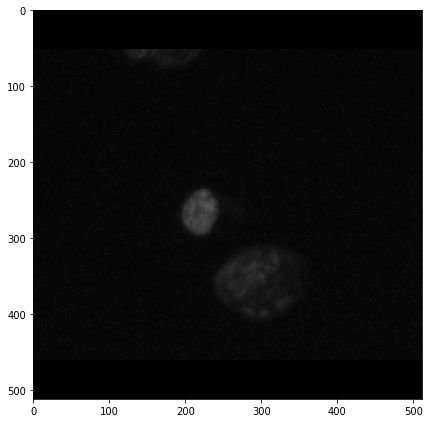

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:   97.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -6.90000
image_metas              shape: (1, 12)               min:    0.00000  max:  512.00000


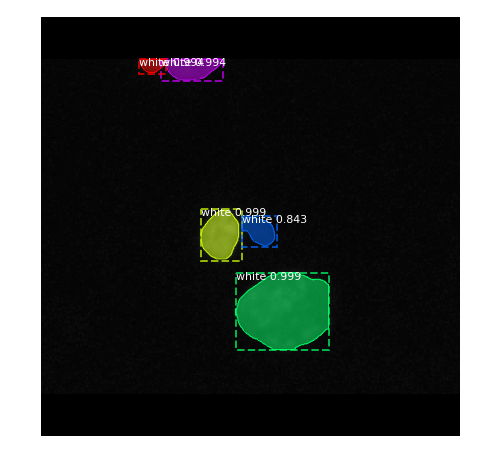

mask shape:(512, 512, 1)
(512, 410, 1)


In [20]:
# Test on a random test image

i = random.randint(0, len(test_set)-1)
print(i)
test = test_set[10]
print(test)
test_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
print("original shape:{}".format(test_img.shape))
test_img,_, scale,padding = resize_image(test_img, min_dim=512,max_dim=512, padding=True)
print("resized shape:{}, scale:{}, padding:{}".format(test_img.shape,scale, padding))
plt.figure(figsize=(6,6))
imshow(test_img)
plt.show()

results = model.detect([test_img], verbose=1)
r = results[0]
visualize.display_instances(test_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())
first_mask = r['masks'][:,:,0]
first_mask = np.expand_dims(first_mask, axis=2)
print('mask shape:{}'.format(first_mask.shape))
print(resize_mask(first_mask, scale, padding).shape)

In [13]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
# image_ids = np.random.choice(val_data.image_ids, 65)
APs = []
half_APs = []
for i, image_id in tqdm(enumerate(val_data.image_ids), total = len(val_data.image_ids)):
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(val_data, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    # Compute AP
    for iou in [0.5, 0.55, 0.6, 0.65, 0.7,0.75, 0.8,0.85, 0.9,0.95]:
        AP, _, _, _ =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=iou)
        
        APs.append(AP)
        if iou == 0.5:
            half_APs.append(AP)
    
print("0.5-0.95 mAP: ", np.mean(APs))
print("0.5 mAP: ", np.mean(half_APs))

100%|██████████| 67/67 [01:12<00:00,  1.08s/it]

0.5-0.95 mAP:  0.6251880771588139
0.5 mAP:  0.8786684906924993


origin_size:(256, 256, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   17.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000
(512, 512, 11)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:38: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and


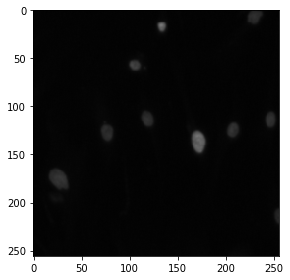

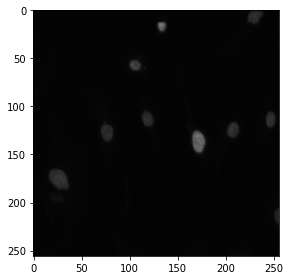

(512, 512)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:33: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [7]:
i = 0
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']


revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

print(masks.shape)
imshow(revert_img)
plt.show()

imshow(origin_img)
plt.show()
print(masks[:,:,0].shape)


for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
        
        
# for i in range(masks.shape[-1]):
#     print(masks[:,:,i].shape)
#     print(revert_resizing(masks[:,:,i], scale, padding).shape)
#     imshow(np.squeeze(masks[:,:,i]))
#     plt.show()

origin_size:(512, 640, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  138.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   34.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


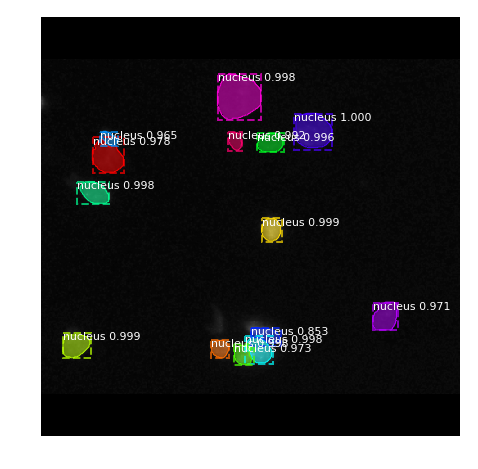

/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:40: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:34: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data 

14


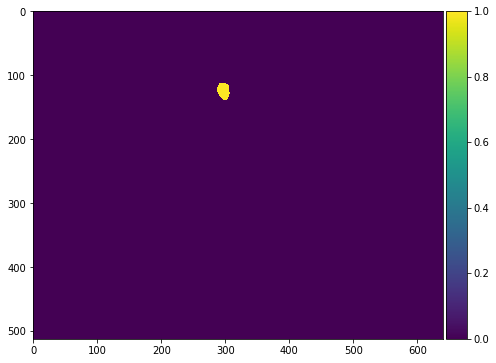

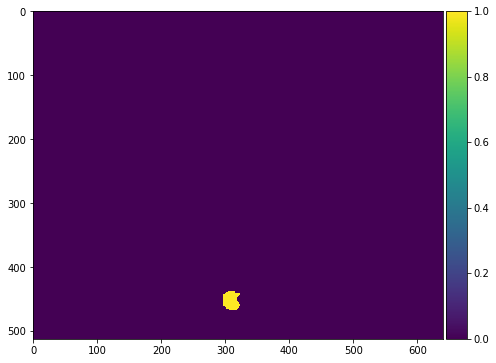

(array([], dtype=int64), array([], dtype=int64))


In [11]:
# debug image
i = 2
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']
r = results[0]
visualize.display_instances(resized_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())



revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

reverted_masks = []
for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
    reverted_masks.append(reverted)


# inter = reverted_masks[2]*reverted_masks[5]
# print(np.nonzero(inter))



print(len(reverted_masks))
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[8]))
plt.show()
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[10]))
plt.show()

inter = reverted_masks[8]*reverted_masks[10]
print(np.nonzero(inter))
row, col = np.nonzero(inter)
if len(row)>0:
    reverted_masks[8][row, col] = 0
# for i in range(len(reverted_masks)):
#     for j in range(i+1,len(reverted_masks)):
#         print("i:{}, j:{}".format(i,j))
#         inter = reverted_masks[i]*reverted_masks[j]
#         assert(len(np.nonzero(inter)[0]) == 0)


In [15]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

in total 65 images to predict


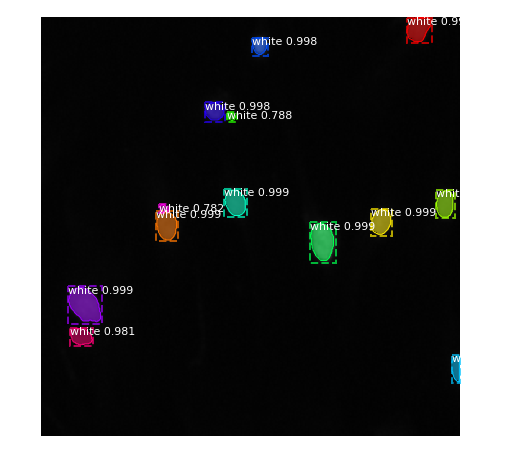

13 masks detected, lowest score is 0.7821915745735168


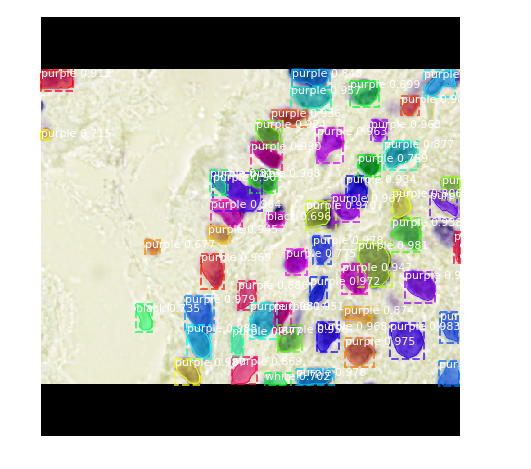

54 masks detected, lowest score is 0.6766064763069153


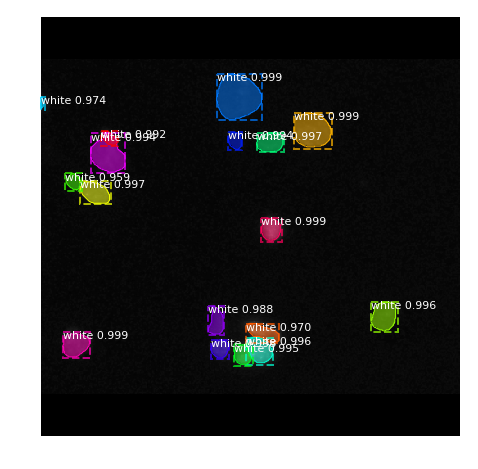

17 masks detected, lowest score is 0.9587929248809814


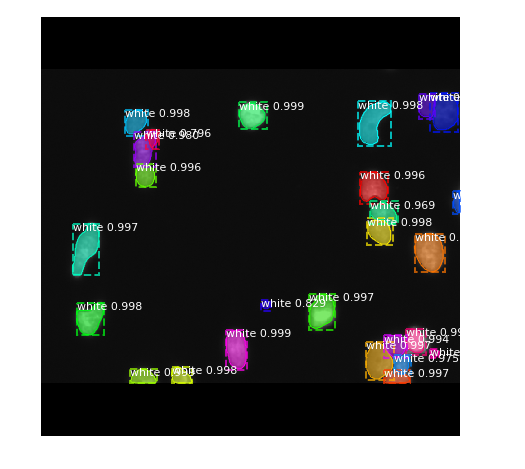

26 masks detected, lowest score is 0.7711014151573181


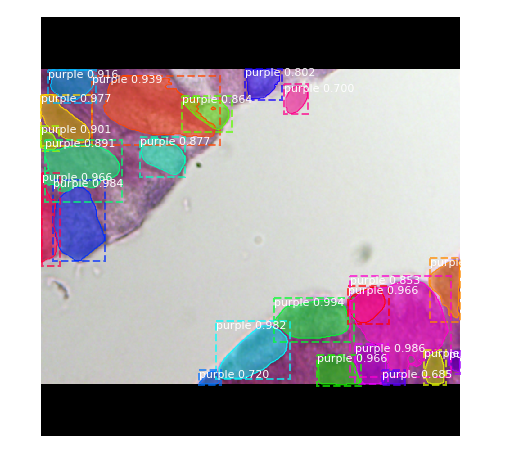

22 masks detected, lowest score is 0.6852766275405884


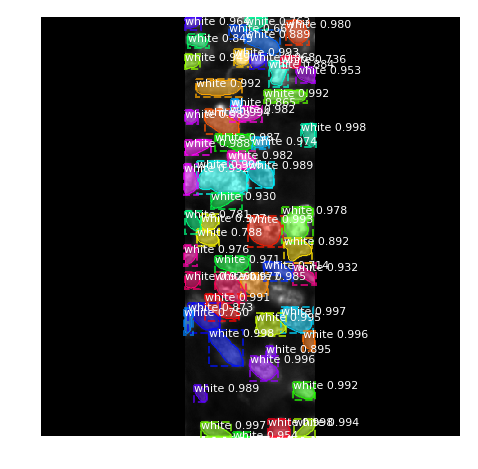

55 masks detected, lowest score is 0.6667808890342712


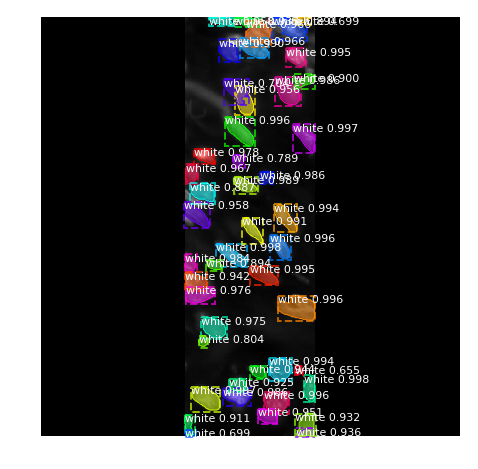

46 masks detected, lowest score is 0.6552558541297913


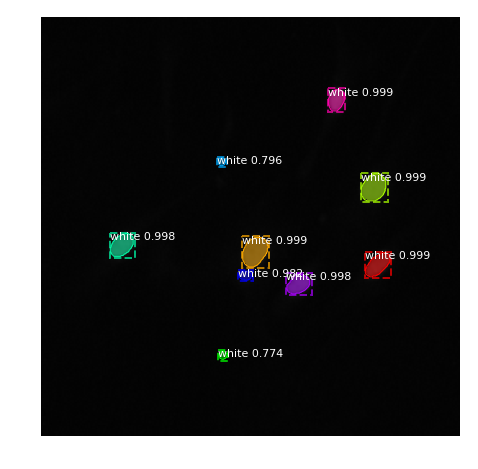

9 masks detected, lowest score is 0.7739419341087341


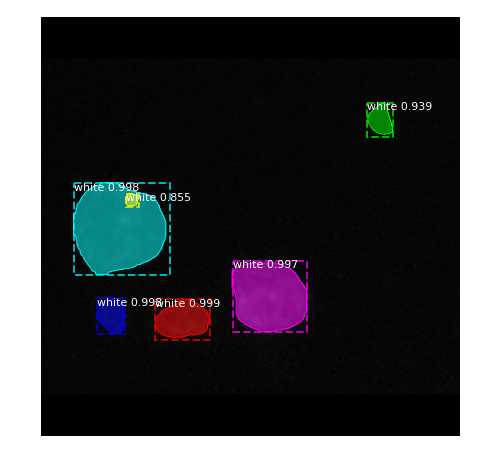

6 masks detected, lowest score is 0.8553911447525024


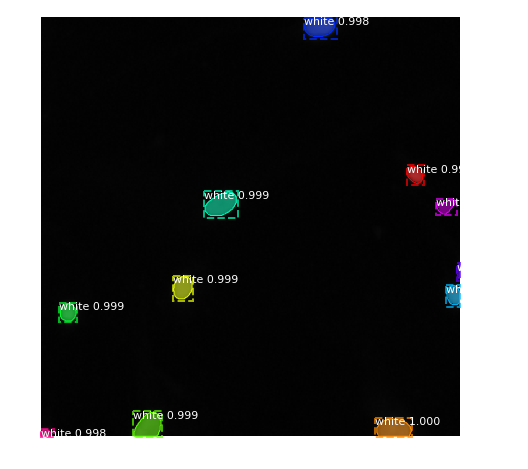

11 masks detected, lowest score is 0.7802589535713196


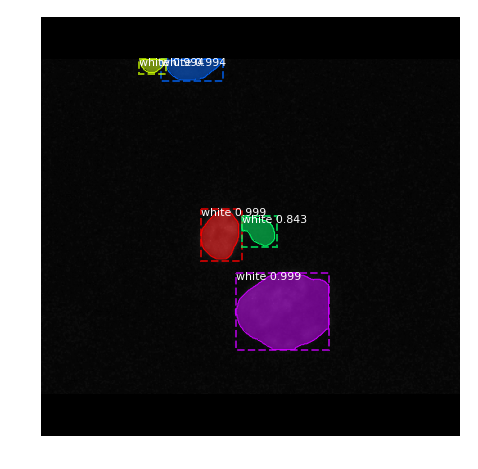

5 masks detected, lowest score is 0.8433154225349426


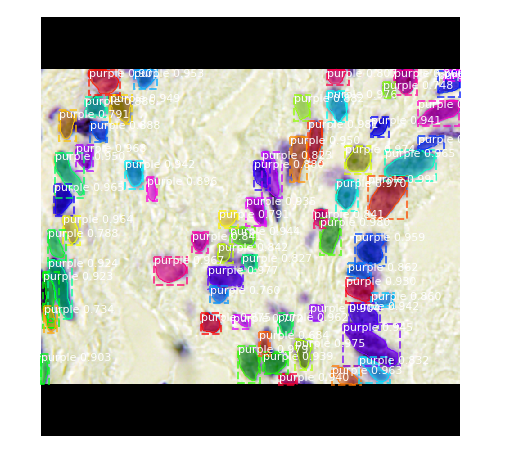

63 masks detected, lowest score is 0.6532987356185913


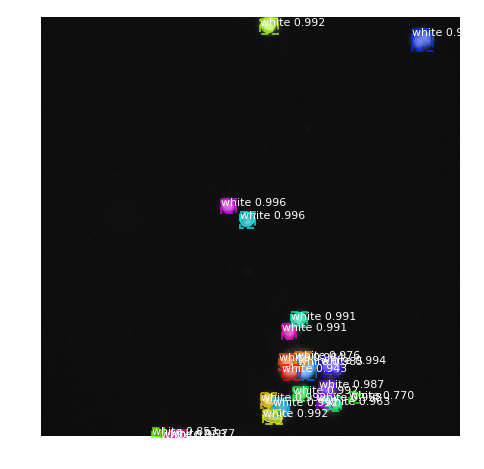

22 masks detected, lowest score is 0.7701210975646973


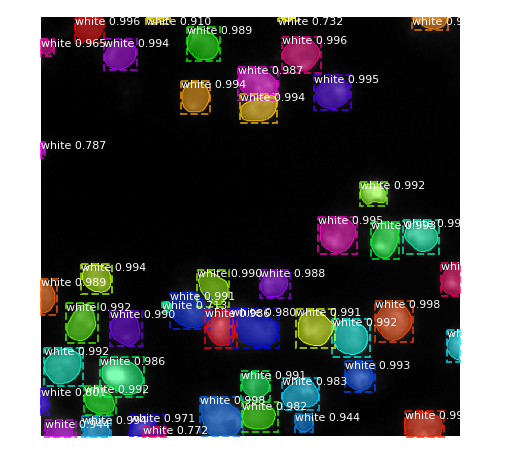

47 masks detected, lowest score is 0.7134718298912048


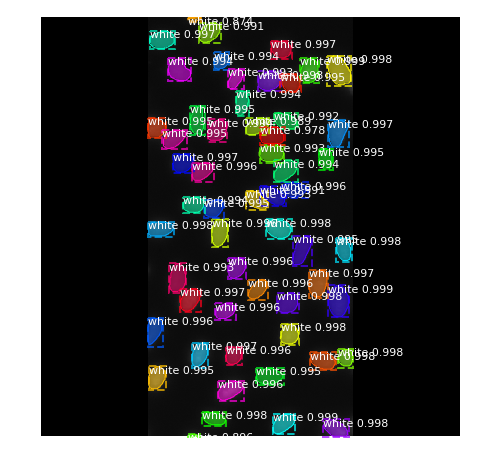

56 masks detected, lowest score is 0.8742852807044983


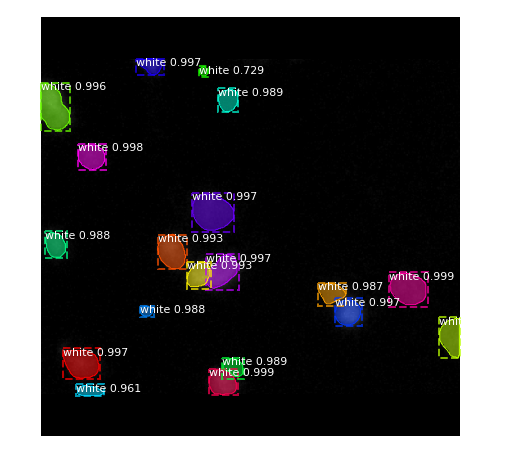

19 masks detected, lowest score is 0.7287577986717224


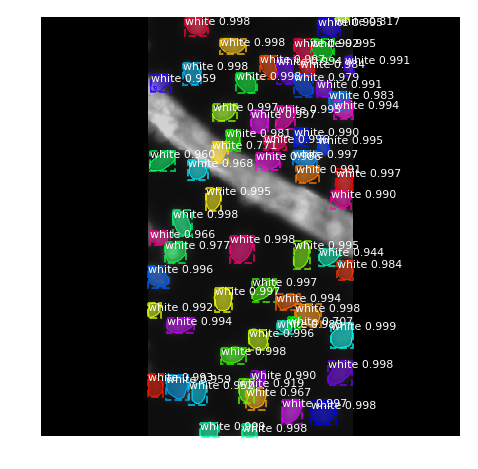

63 masks detected, lowest score is 0.7065550684928894


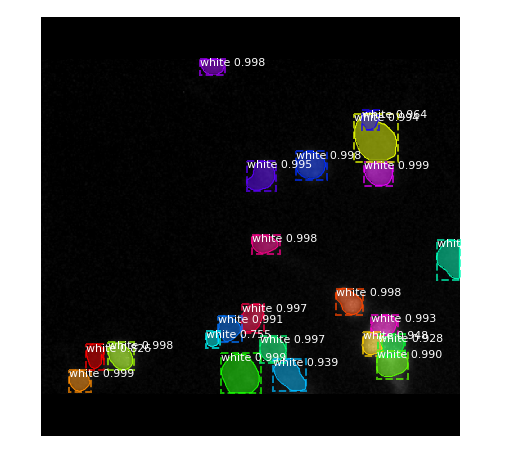

22 masks detected, lowest score is 0.7547125816345215


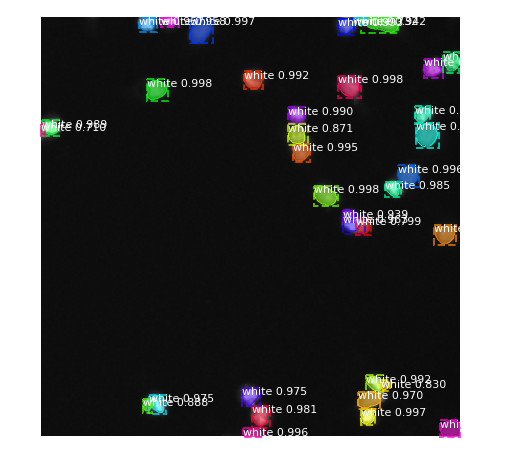

35 masks detected, lowest score is 0.7095100283622742


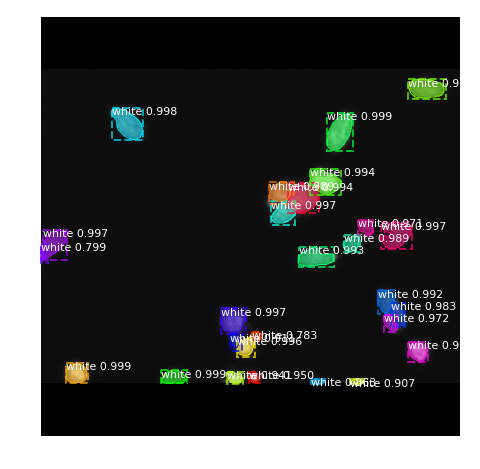

27 masks detected, lowest score is 0.7833735942840576


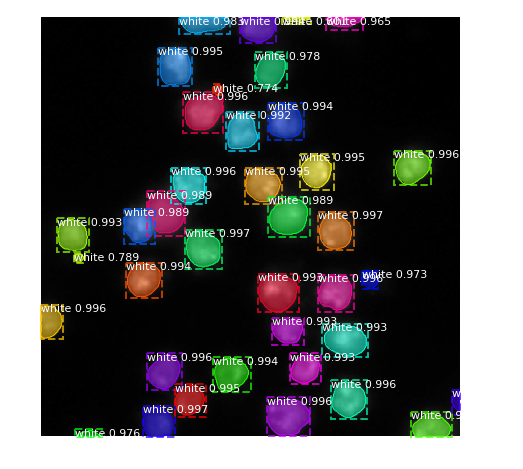

38 masks detected, lowest score is 0.7737430334091187


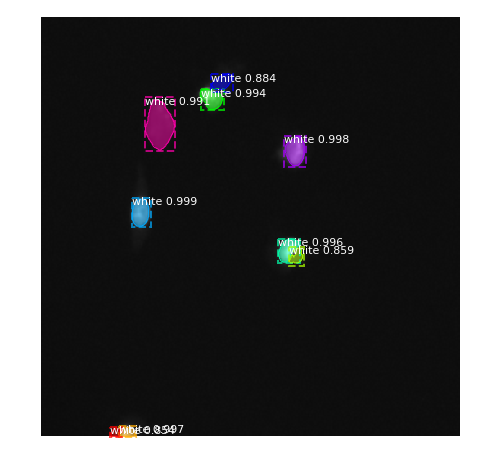

9 masks detected, lowest score is 0.8538075685501099


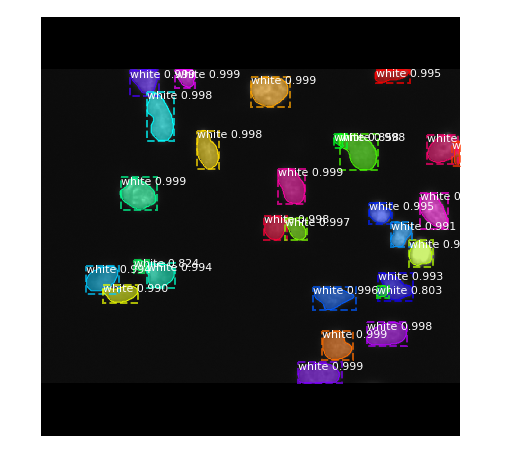

28 masks detected, lowest score is 0.802653968334198


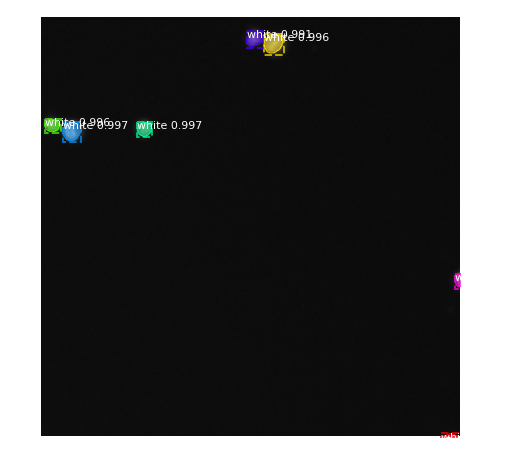

7 masks detected, lowest score is 0.9369601607322693


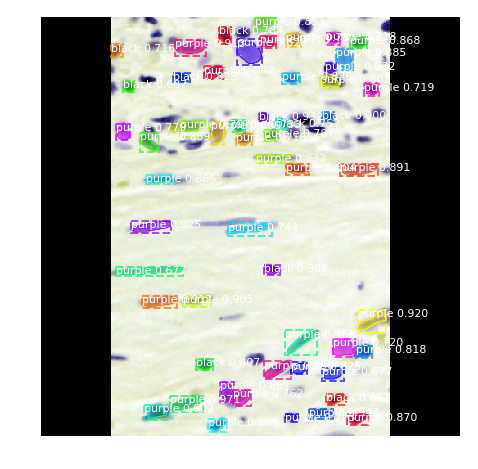

54 masks detected, lowest score is 0.6620444655418396


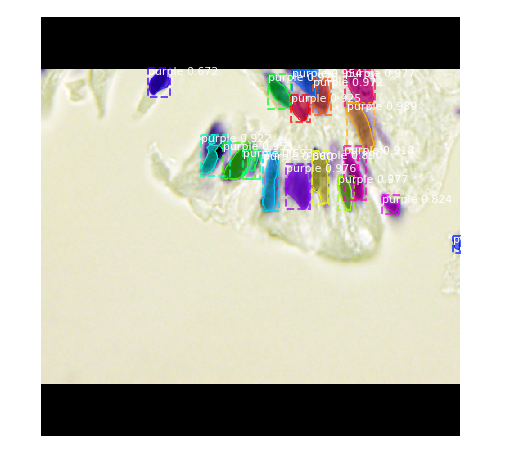

17 masks detected, lowest score is 0.6721820831298828


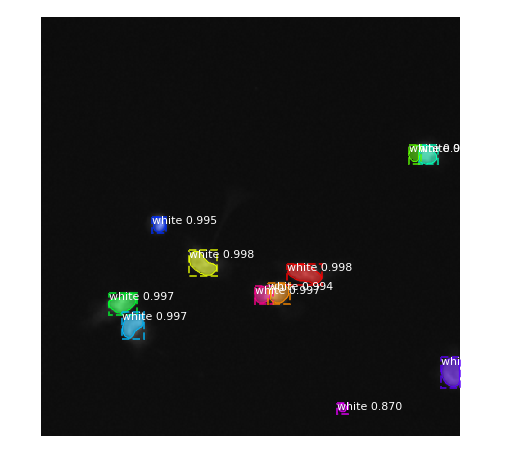

11 masks detected, lowest score is 0.8695885539054871


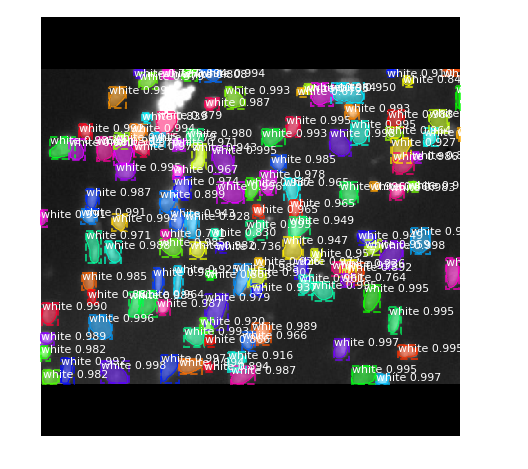

124 masks detected, lowest score is 0.6722540855407715


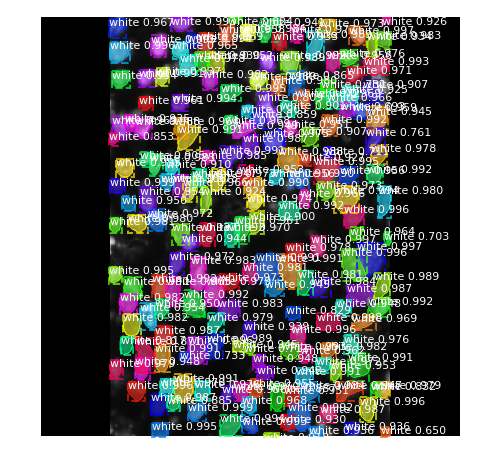

192 masks detected, lowest score is 0.650397539138794


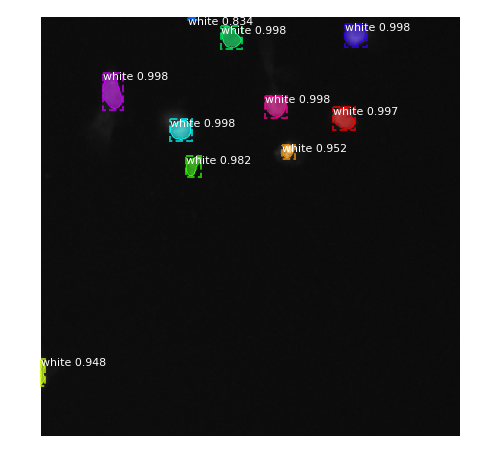

10 masks detected, lowest score is 0.8337078094482422


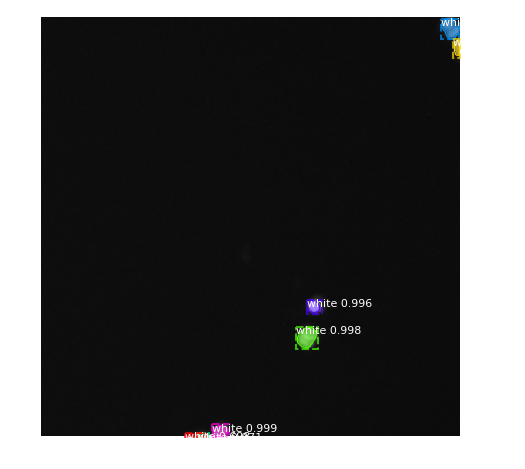

7 masks detected, lowest score is 0.697594940662384


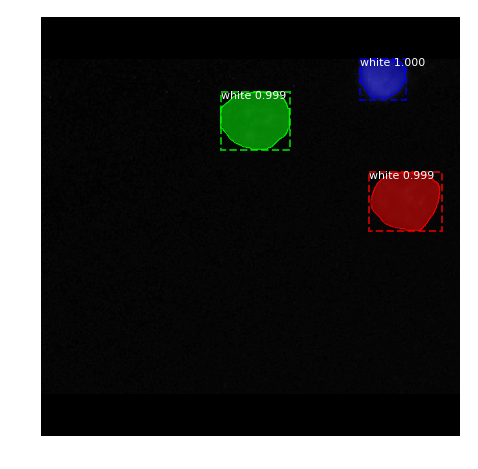

3 masks detected, lowest score is 0.9991446733474731


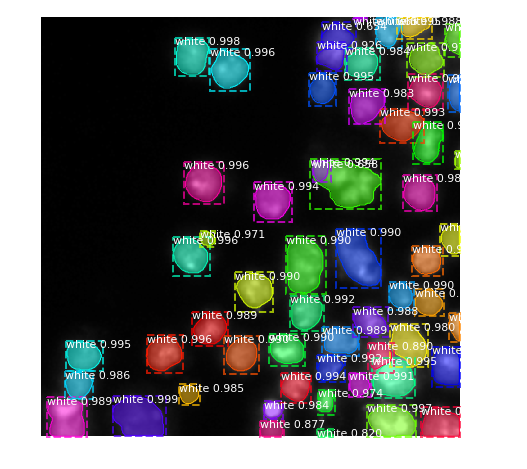

57 masks detected, lowest score is 0.6535305380821228


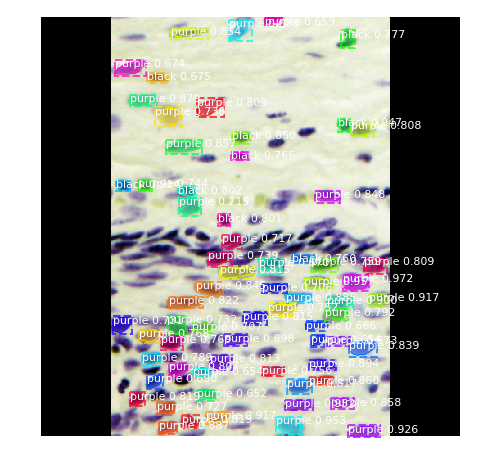

67 masks detected, lowest score is 0.6517080664634705


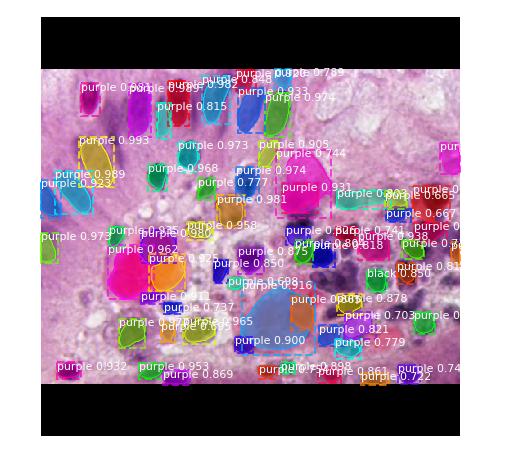

65 masks detected, lowest score is 0.665314793586731


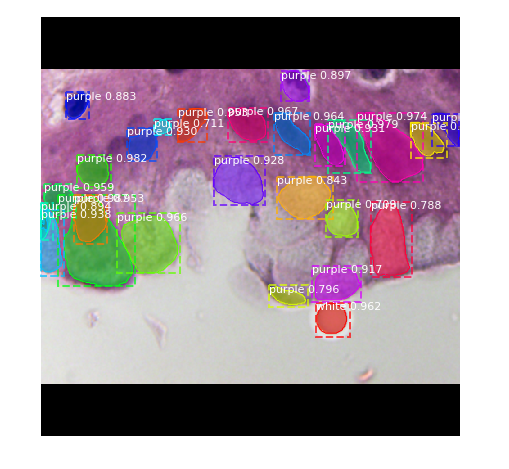

26 masks detected, lowest score is 0.7092607617378235


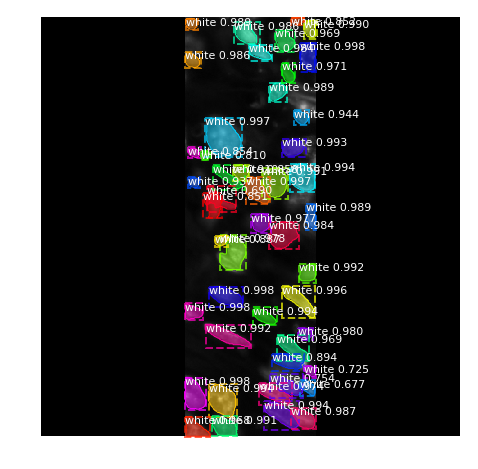

47 masks detected, lowest score is 0.6767237782478333


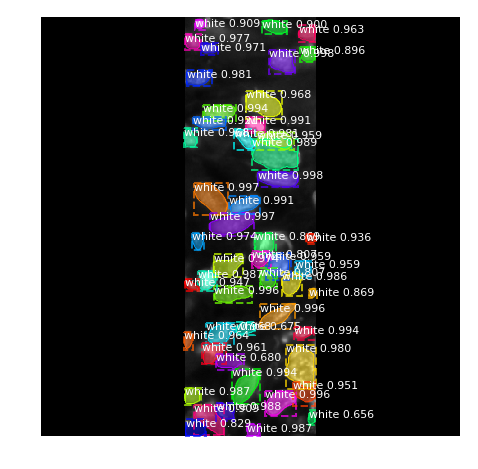

50 masks detected, lowest score is 0.656049907207489


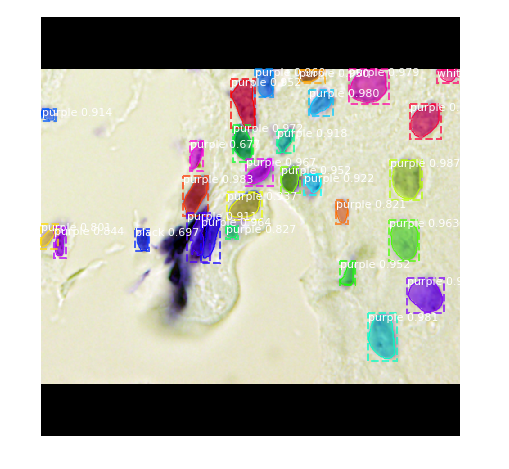

28 masks detected, lowest score is 0.6768448948860168


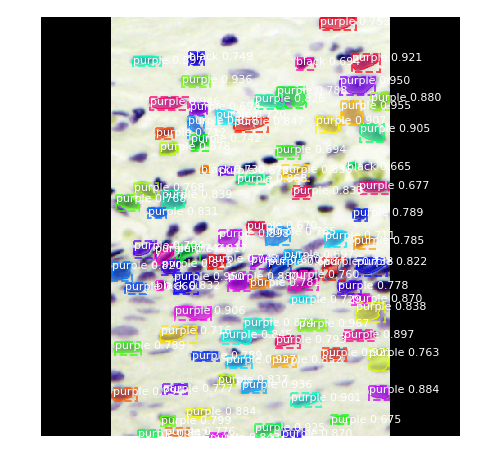

87 masks detected, lowest score is 0.6646214723587036


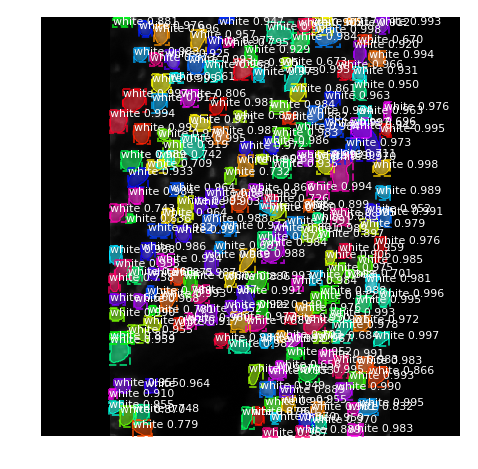

196 masks detected, lowest score is 0.6564179062843323


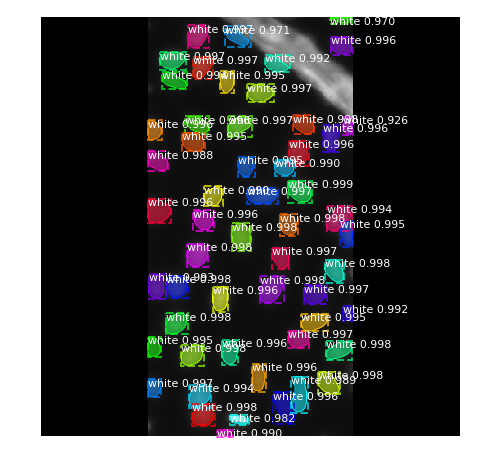

55 masks detected, lowest score is 0.9260455965995789


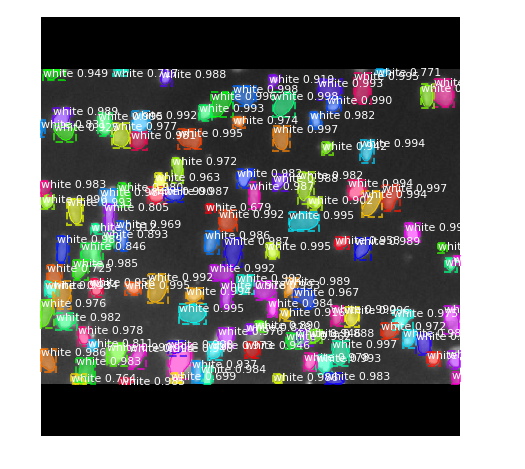

117 masks detected, lowest score is 0.6791069507598877


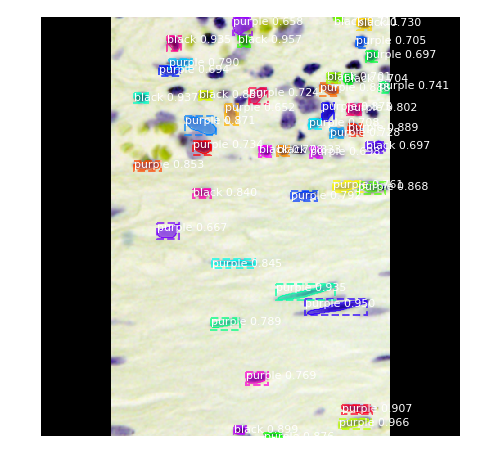

43 masks detected, lowest score is 0.652233898639679


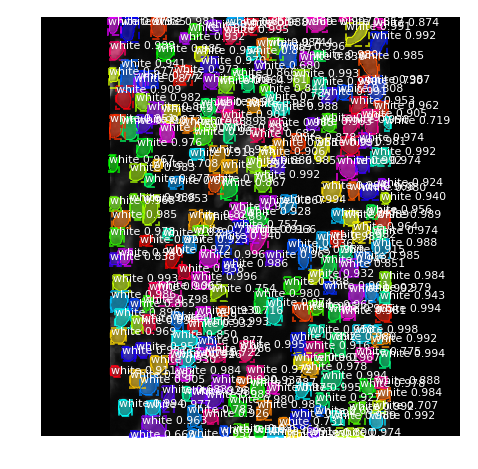

233 masks detected, lowest score is 0.6629456281661987


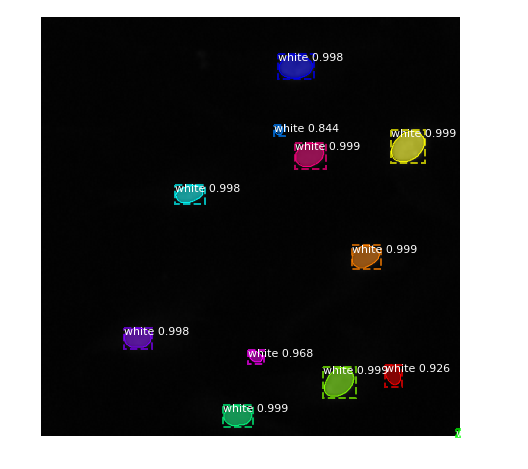

12 masks detected, lowest score is 0.8441917300224304


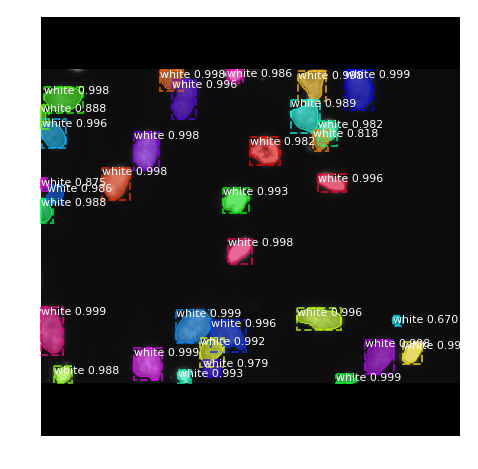

33 masks detected, lowest score is 0.6697181463241577


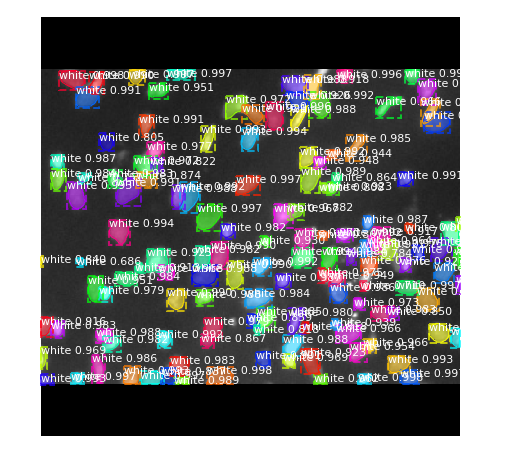

135 masks detected, lowest score is 0.6863627433776855


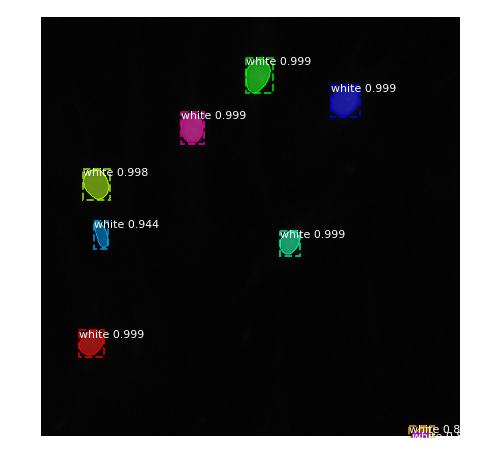

9 masks detected, lowest score is 0.8012382388114929


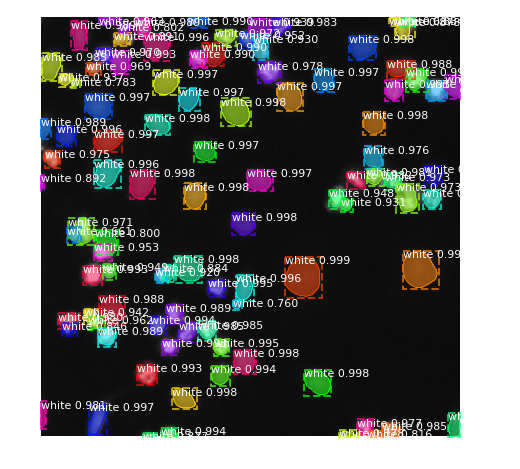

98 masks detected, lowest score is 0.6614996194839478


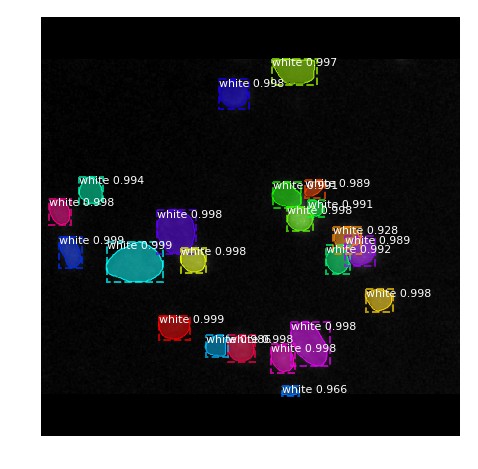

22 masks detected, lowest score is 0.9283010363578796


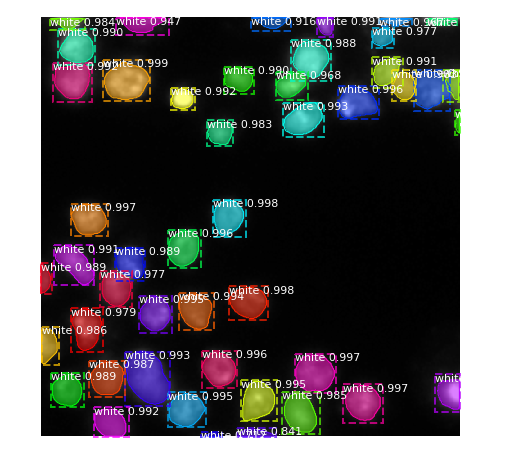

47 masks detected, lowest score is 0.7124007344245911


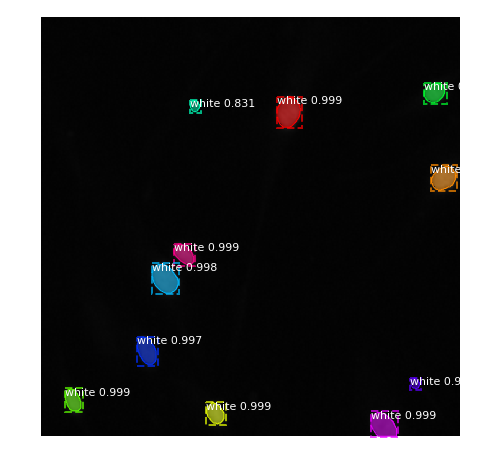

11 masks detected, lowest score is 0.8307210803031921


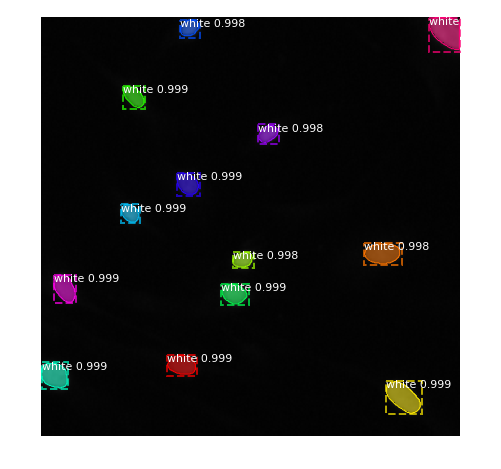

13 masks detected, lowest score is 0.9980520009994507


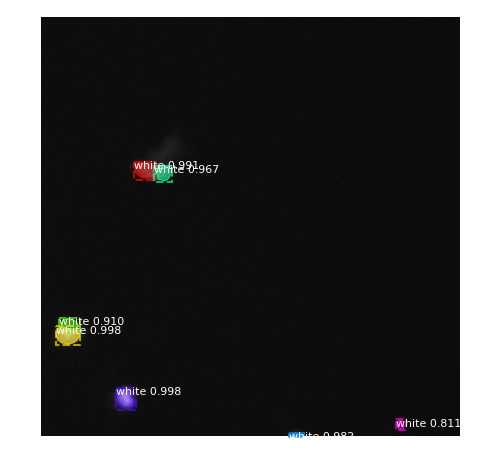

7 masks detected, lowest score is 0.8110927939414978


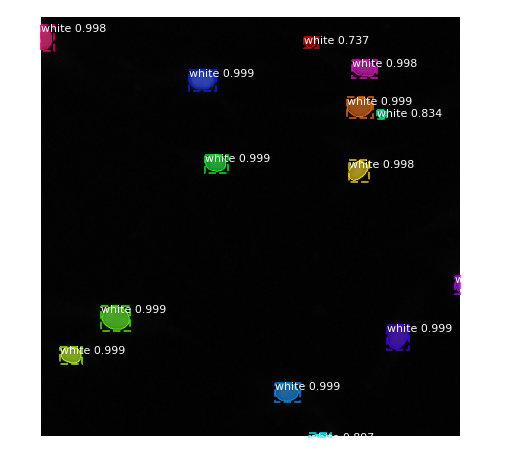

14 masks detected, lowest score is 0.7366219758987427


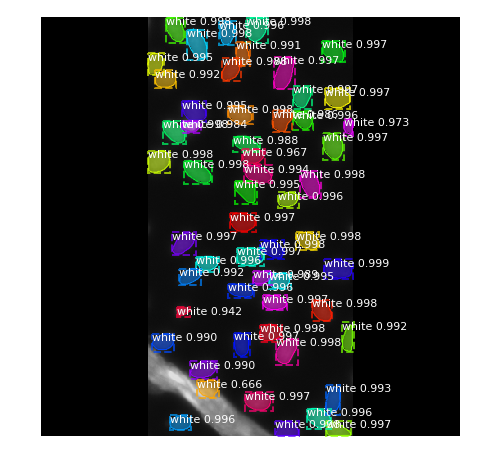

55 masks detected, lowest score is 0.6664460301399231


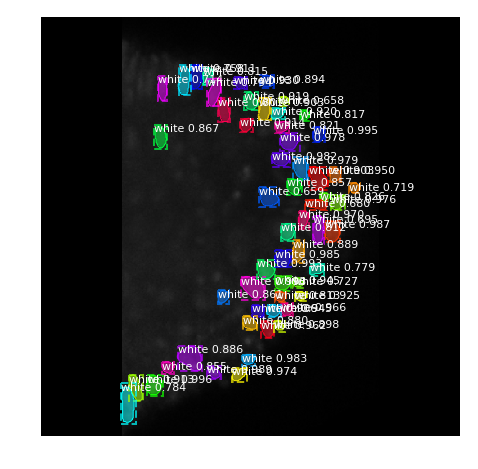

56 masks detected, lowest score is 0.6583893895149231


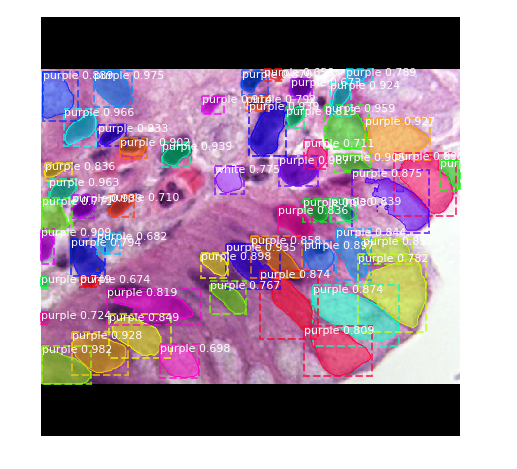

54 masks detected, lowest score is 0.657920241355896


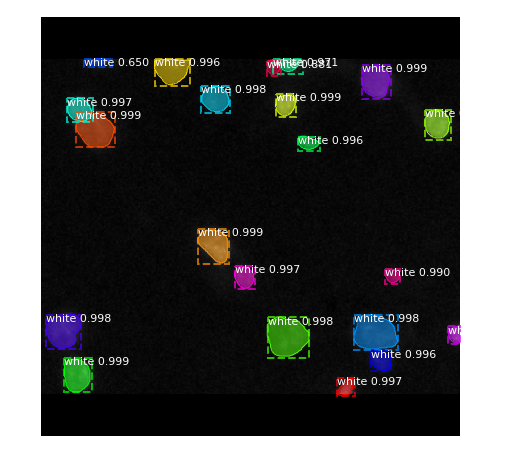

21 masks detected, lowest score is 0.6501799821853638


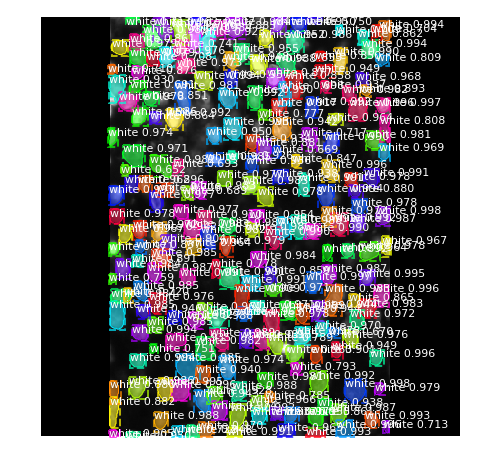

220 masks detected, lowest score is 0.6517369747161865


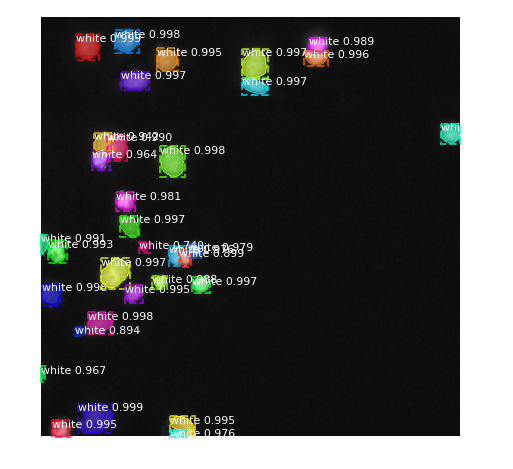

33 masks detected, lowest score is 0.74007248878479


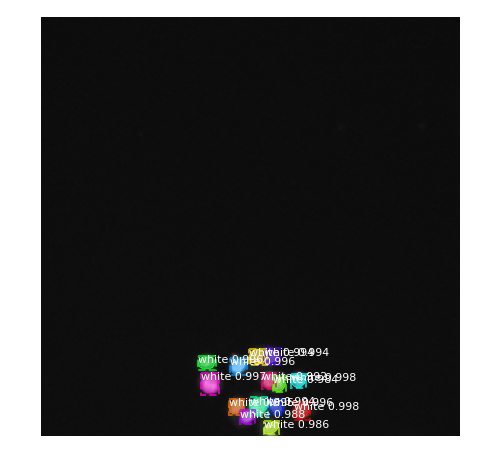

14 masks detected, lowest score is 0.9835174083709717


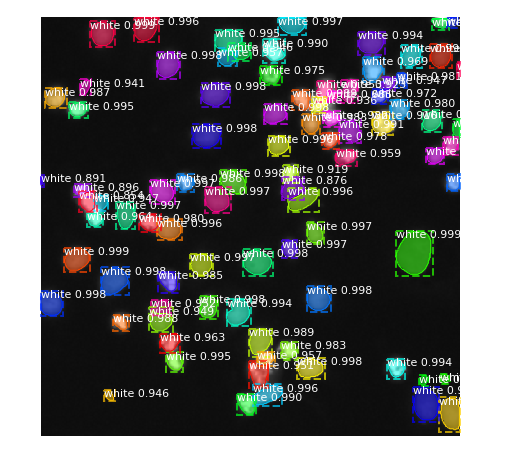

88 masks detected, lowest score is 0.6849706172943115


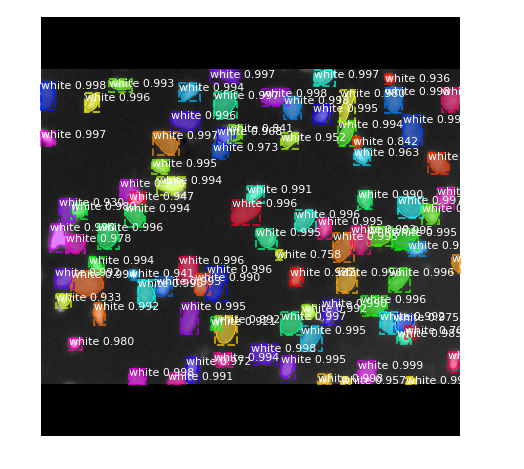

90 masks detected, lowest score is 0.7053133249282837
submision file completed!


In [21]:
import warnings
warnings.filterwarnings('ignore')


# Run-length encoding stolen from https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# convert single mask shape (h,w) into a list, 1: foreground, 0: background
def rle_encoding(x, total_pixel):
#     total = x.T.flatten().shape[0]
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

from skimage.morphology import binary_dilation
from skimage.morphology import disk
def refineMasks(mask):
    return binary_dilation(mask, disk(1))


def single_image(test):
    lines = []
    image_id =  test['image']['pathname']
    origin_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
#     print("origin image shape:{}".format(origin_img.shape))
    resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)
#     print("handing img:{}, scale:{}, padding:{}".format(image_id, scale, padding))


    results = model.detect([resized_img], verbose=0)
    scores = results[0]['scores']
    masks = results[0]['masks']
    visualize.display_instances(resized_img, results[0]['rois'], masks, results[0]['class_ids'], 
                            train_data.class_names, scores, ax=get_ax())
    s0 = 1
    for s in scores:
        if s< s0:
            s0 = s
    print("{} masks detected, lowest score is {}".format(masks.shape[-1], s0))
    
    reverted_masks = []
    for i in range(masks.shape[-1]):
        mask = masks[:,:,i]
        reverted_mask = revert_resizing(mask, origin_img.shape, padding)
        assert(reverted_mask.shape[0] == origin_img.shape[0])
        assert(reverted_mask.shape[1] == origin_img.shape[1])
#         reverted_mask = refineMasks(reverted_mask)
        reverted_masks.append(reverted_mask)
    
    for i in range(len(reverted_masks)):
        for j in range(i+1, len(reverted_masks)):
            interaction = reverted_masks[i]*reverted_masks[j]
            row, col = np.nonzero(interaction)
            if len(row)>0:
#                 print("before, {} pixels overlapping between mask {} and {}".format(len(row), i, j))
                reverted_masks[i][row, col] = 0
#                 print("after, {} pixels overlapping".format(len(np.nonzero(reverted_masks[i]*reverted_masks[j])[0])))
                
    
    for i in range(len(reverted_masks)):
        assert(reverted_masks[i].shape[0] == origin_img.shape[0])
        assert(reverted_masks[i].shape[1] == origin_img.shape[1])
        rle = rle_encoding(reverted_masks[i], origin_img.shape[0]*origin_img.shape[1])
        lines.append("{},{}".format(image_id[:-4],' '.join(map(str, rle))))
    return lines

base_dir = '../DSB2018'
test_set = load_testset(os.path.join(base_dir, 'test.json'))
print("in total {} images to predict".format(len(test_set)))
with open('crop_all_flip_multiclass_27_acc0.65.csv', 'w') as f: 
    f.write('ImageId,EncodedPixels\n')
    for i, test in enumerate(test_set):
        lines = single_image(test)
        for line in lines:
            if line.endswith(','):
                print("no pixel in mask:{}".format(line))
                continue
            f.write(line)
            f.write('\n')
    
print("submision file completed!")

In [14]:
print(len(test_set))

65


In [12]:
import numpy as np
a = np.array([[1,1,0], [0,0,0], [1,0,0]])
b = np.array([[0,0,0], [0,0,0], [0,0,0]])
print(a*b)
len(np.nonzero(a*b)[0]) == 0

[[0 0 0]
 [0 0 0]
 [0 0 0]]


True

In [21]:
for i in range(1, 10):
    print(i)

1
2
3
4
5
6
7
8
9
